In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

def plot_12(fig1, fig2):
    cmap1 = fig1.setdefault('cmap', 'Paired')
    cmap2 = fig2.setdefault('cmap', 'Paired')
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(fig1['image'], cmap=cmap1)
    ax1.set_title(fig1['title'], fontsize=30)
    ax2.imshow(fig2['image'], cmap=cmap2)
    ax2.set_title(fig2['title'], fontsize=30)
    #plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

Camera calibration is done in *p4lib/calibration.py* where a class _Calibration_ is created. It is initialized with a directory (from where it'll take calibration images) and a filename (where it'll save calibration matrices).

Relevant code is provided here

```python
# Arrays to store object points and image points from all the images.
# Object points are assumed to be on the same plane and are equally separated
# Image points are 2D points from chesseboard images. They'll be mapped to 3D objects points
# to compute the distortion
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

img_size = None
# Iterate over each calibration image
for calibration_img in os.listdir(calibration_dir):
    image_file = os.path.join(calibration_dir, calibration_img)
    img = cv2.imread(image_file)

    if not img_size:
        img_size = img.shape[0:2]

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret = False
    idx = 0
    # Try to find different sets of intersections in the chesseboard given that
    # in some images not all the chesseboard is fully visible
    coord = [(9, 6), (8, 6), (9, 5), (8, 5)]
    while not ret and idx < len(coord):
        nm = coord[idx]
        idx += 1
        ret, corners = cv2.findChessboardCorners(gray, nm, None)

    if ret:
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((nm[1] * nm[0], 3), np.float32)
        objp[:,:2] = np.mgrid[0:nm[0], 0:nm[1]].T.reshape(-1,2)

        objpoints.append(objp)
        imgpoints.append(corners)
    else:
        print('Image {} discarded'.format(image_file))

# Do camera calibration given object points and image points
self.ret, self.mtx, self.dist, self.rvecs, self.tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
```

## Apply a distortion correction to raw images

After calibrating the camera, we have to use that information to correct for distortion on every image taken with the camera. Correction is made with _Calibration_ class calling to _undistort_ method. Here we'll see the effect of this correction with a chess board image and a traffic image:

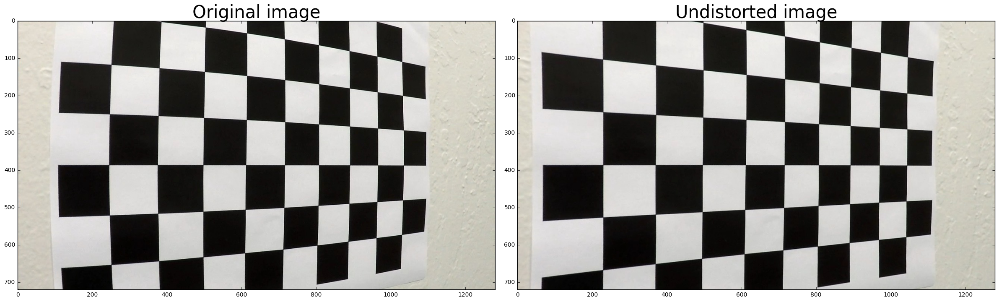

In [2]:
from p4lib.calibration import Calibration
cal = Calibration('camera_cal', 'cal.p')

chessboard = mpimg.imread('camera_cal/calibration5.jpg')
chessboard_udst = cal.undistort(chessboard)

plot_12({'image': chessboard, 'title': 'Original image'},
        {'image': chessboard_udst, 'title': 'Undistorted image'})

Here we can appretiate how the left side of the chessboard was rectified

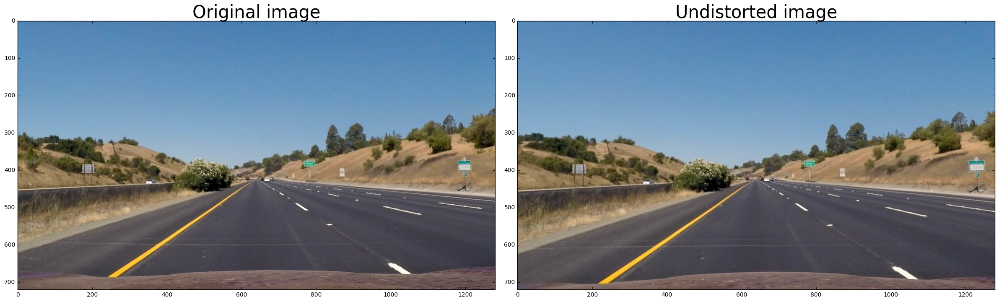

In [3]:
lanes = mpimg.imread('test_images/straight_lines1.jpg')
lanes_udst = cal.undistort(lanes)
plot_12({'image': lanes, 'title': 'Original image'},
        {'image': lanes_udst, 'title': 'Undistorted image'})

And here we can appretiate how the traffic sign on the right was "moved". Camera distortions appears on the edges of the image, that's why the image seems the same but it has little changes. In an animation the correction is more evident:

![Undistortion animation](writeup_resources/undistortion.gif)

## Apply a perspective transform to rectify binary image ("birds-eye view")

To easily detect lanes and to compute its curvature, it's better to change the perspective of the image to see the image "from the sky". To achieve this, we have to select four points that we know that defines two parallel lines in the real world (like lane lines) and map those points to a new perspective where those lines are actually parallel. This is called birds-eye view.

To have a correct visualisation of the new perspective, it's also good to change the image size to keep real proportions. The relevant code to calculate the four points and its corresponding mapping is here:

```python
## Perspective transform (bird-eye)
y = lanes.shape[0]
x = lanes.shape[1]
orig_img_size = (x, y)

# Src points are calculated as a % of the image size given a previous manual calibration
src = np.float32([[int(0.446 * x), int(0.645 * y)],
                  [int(0.554 * x), int(0.645 * y)],
                  [int(0.872 * x), y],
                  [int(0.150 * x), y]])


ym_per_pix = 30  / 720 # meters per pixel in y dimension
xm_per_pix = 3.7 / 700 # meteres per pixel in x dimension

# Perspective size is 5.55 (3.7 lane + 0.925 at each side) meters width and 25 meters height
y = int(25 / ym_per_pix)
width = int(3.7 / xm_per_pix)
offset = int(width / 4)
x = 2 * offset + width
img_size = (x, y)

# Dst points
dst = np.float32([[offset, 0],
                  [x - offset, 0],
                  [x - offset, y],
                  [offset, y]])
```

This code maps the points from a 1280x720 image to a 1050x600 in the following way:

Source      | Destination
------------|------------
(570, 464)  | (175, 0)
(709, 464)  | (875, 0)
(1116, 720) | (875, 600)
(192, 720)  | (175, 600)

The warping is handled by the class _Perspective_, defined in *p4lib/perspective.py* wich receive src and dst points and the original image size and warped size, to convert back and forth. The relevant code of the class is:

```python
class Perspective():
    '''
    Map four src points from orig_img_size to dst points in warped_image_size
    '''

    def __init__(self, src, dst, original_image_size, warped_image_size):
        # Compute transformation matrix (and its inverse)
        self.M = cv2.getPerspectiveTransform(src, dst)
        self.Minv = cv2.getPerspectiveTransform(dst, src)
        self.original_image_size = original_image_size
        self.warped_image_size = warped_image_size

    def warp(self, image):
        return cv2.warpPerspective(image, self.M, self.warped_image_size)

    def unwarp(self, image):
        return cv2.warpPerspective(image, self.Minv, self.original_image_size)
```

In the following picture we'll see the result of warping an image:

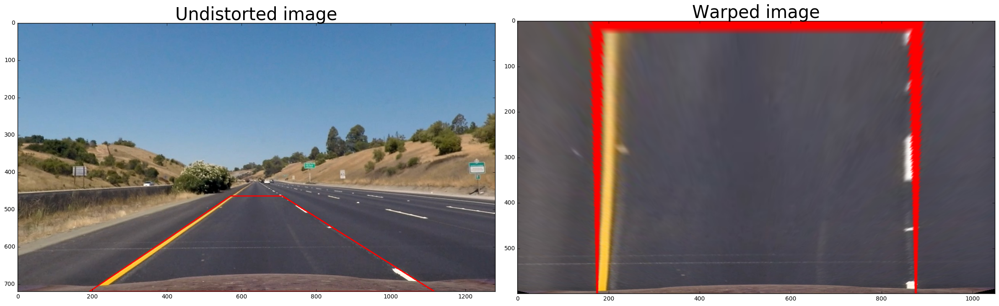

In [4]:
from p4lib.perspective import Perspective

## Perspective transform (bird-eye)
y = lanes.shape[0]
x = lanes.shape[1]
orig_img_size = (x, y)

# Src points are calculated as a % of the image size given a previous manual calibration
src = np.float32([[int(0.446 * x), int(0.645 * y)],
                  [int(0.554 * x), int(0.645 * y)],
                  [int(0.872 * x), y],
                  [int(0.150 * x), y]])

# Draw the polygon conformed by the points
img_copy = np.copy(lanes_udst)
cv2.polylines(img_copy, [np.int_(src)], True, (255, 0, 0), 2)

ym_per_pix = 30  / 720 # meters per pixel in y dimension
xm_per_pix = 3.7 / 700 # meteres per pixel in x dimension

# Perspective size is 5.55 (3.7 lane + 0.925 at each side) meters width and 25 meters height
y = int(25 / ym_per_pix)
width = int(3.7 / xm_per_pix)
offset = int(width / 4)
x = 2 * offset + width
img_size = (x, y)

# Dst points
dst = np.float32([[offset, 0],
                  [x - offset, 0],
                  [x - offset, y],
                  [offset, y]])

birds_eye = Perspective(src, dst, orig_img_size, img_size)

warped_lanes = birds_eye.warp(img_copy)

plot_12({'image': img_copy, 'title': 'Undistorted image'},
        {'image': warped_lanes, 'title': 'Warped image'})

It can be appretiated that lane lines are parallel in this perspective

## Use color transforms, gradients, etc., to create a thresholded binary image

For the pipeline two kinds of filters where used: sobel filter (in x and y direction) and color filter (using HSV color space).

The _abs_sobel_thresh_ function is defined in *p4lib/filters.py*:

```python
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    '''
    Define a function that applies Sobel x or y, then takes an absolute value and applies a threshold.
    '''
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output
```

And is applied this way in the pipeline:

```python
# 3) Compute gradient in x and y direction
gradx = filters.abs_sobel_thresh(img, orient='x', sobel_kernel=9, thresh=(20, 100))
grady = filters.abs_sobel_thresh(img, orient='y', sobel_kernel=9, thresh=(20, 100))
# 4) Combine both gradients
comb = np.zeros_like(gradx)
comb[(gradx == 1) & (grady == 1)] = 1
```

After applying the sobel filter to x and y axis, both filters are AND'ed to eliminate the noise and only keep the gradients more consistents with the lanes lines.

In the following picture we'll see how each filter works and the result after the bitwise AND operation:

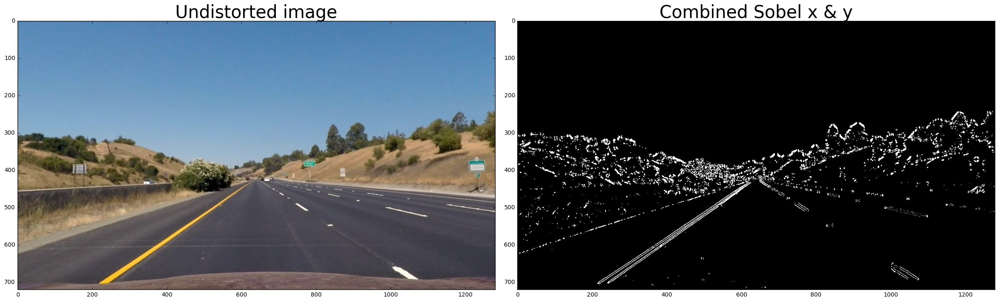

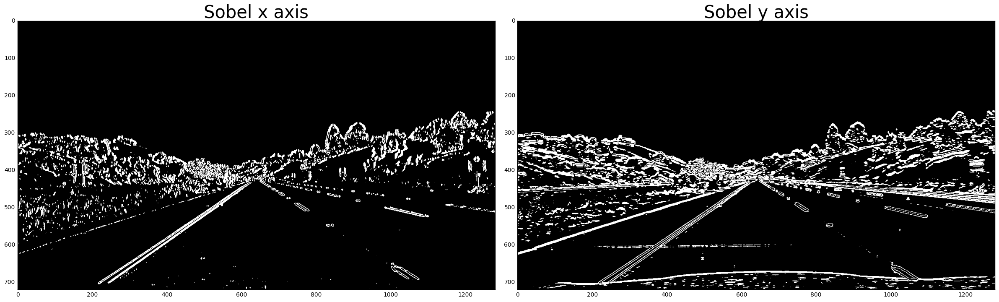

In [5]:
from p4lib import filters

gradx = filters.abs_sobel_thresh(lanes_udst, orient='x', sobel_kernel=9, thresh=(20, 100))
grady = filters.abs_sobel_thresh(lanes_udst, orient='y', sobel_kernel=9, thresh=(20, 100))
comb = np.zeros_like(gradx)
comb[(gradx == 1) & (grady == 1)] = 1

plot_12({'image': lanes_udst, 'title': 'Undistorted image'},
        {'image': comb, 'title': 'Combined Sobel x & y', 'cmap': 'gray'})
plot_12({'image': gradx, 'title': 'Sobel x axis', 'cmap': 'gray'},
        {'image': grady, 'title': 'Sobel y axis', 'cmap': 'gray'})

After applying sobel filter, color filter is used: for this pourpose, images are converted to HSV color space to avoid the effect of lightness (V channel, for Value) and filter only on Hue and Saturation channels. This way a robust filter is created.

The _hsv_range_ function is defined in *p4lib/filters.py*:

```python
def hsv_range(img, low_threshold=np.array([0, 0, 225]), high_threshold=np.array([255, 255, 255])):
    '''
    Convert RGB image to HSV color space and filter in that space
    '''
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    mask = cv2.inRange(hsv, low_threshold, high_threshold)
    mask[mask > 0] = 1
    return mask
```

And in the pipeline is used like this:

```python
# 5) Filter yellow and white color in HSV color space
yellow_hsv_low  = np.array([0, 80, 200])
yellow_hsv_high = np.array([40, 255, 255])
white_hsv_low  = np.array([20, 0, 200])
white_hsv_high = np.array([255, 80, 255])
yellow = filters.hsv_range(img, yellow_hsv_low, yellow_hsv_high)
white = filters.hsv_range(img, white_hsv_low, white_hsv_high)
```

The result of applying this filter is shown in the following picture:

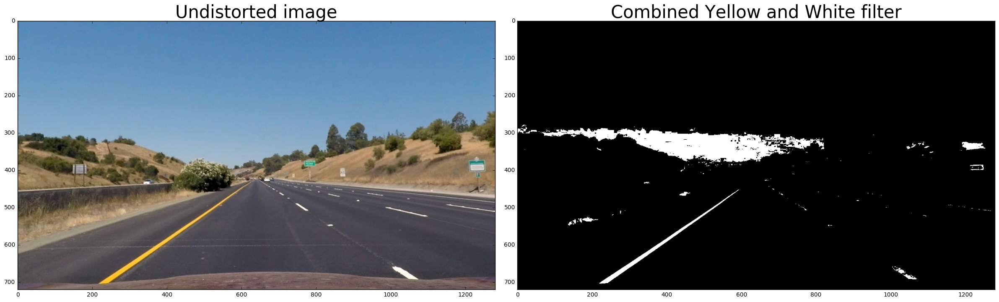

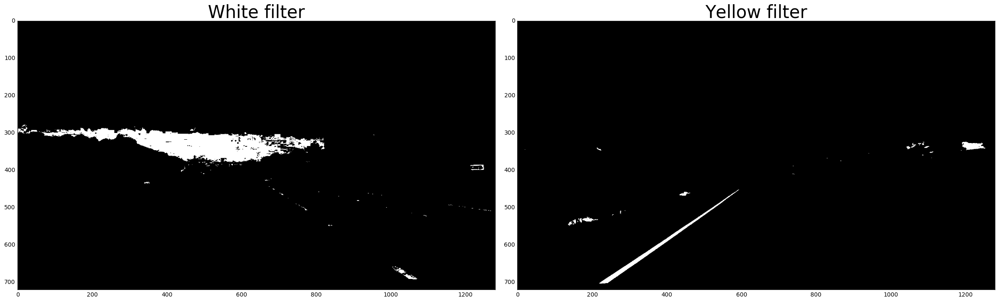

In [6]:
yellow_hsv_low  = np.array([0, 80, 200])
yellow_hsv_high = np.array([40, 255, 255])
white_hsv_low  = np.array([20, 0, 200])
white_hsv_high = np.array([255, 80, 255])
yellow = filters.hsv_range(lanes_udst, yellow_hsv_low, yellow_hsv_high)
white = filters.hsv_range(lanes_udst, white_hsv_low, white_hsv_high)

color_filter = np.zeros_like(white)
color_filter[(yellow == 1) | (white == 1)] = 1

plot_12({'image': lanes_udst, 'title': 'Undistorted image'},
        {'image': color_filter, 'title': 'Combined Yellow and White filter', 'cmap': 'gray'})
plot_12({'image': white, 'title': 'White filter', 'cmap': 'gray'},
        {'image': yellow, 'title': 'Yellow filter', 'cmap': 'gray'})

Then a combined filter is created merging sobel and color masks:

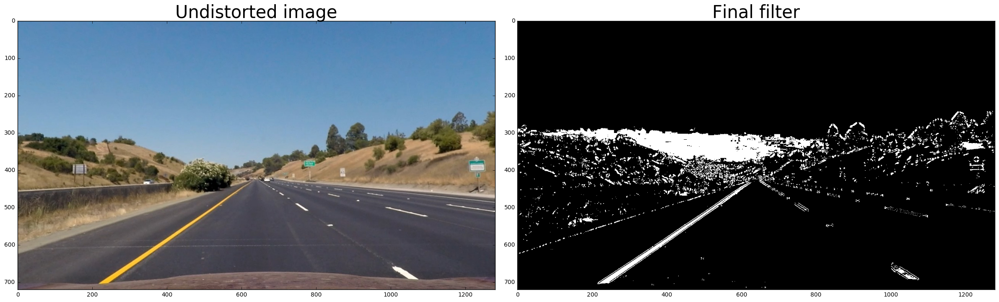

In [7]:
# 6) Combine gradient filter with color filter
binary_image = np.zeros_like(gradx)
binary_image[(comb == 1) | (yellow == 1) | (white == 1)] = 1

plot_12({'image': lanes_udst, 'title': 'Undistorted image'},
        {'image': binary_image, 'title': 'Final filter', 'cmap': 'gray'})

And here's the result of applying the perspective view to the binary filter:

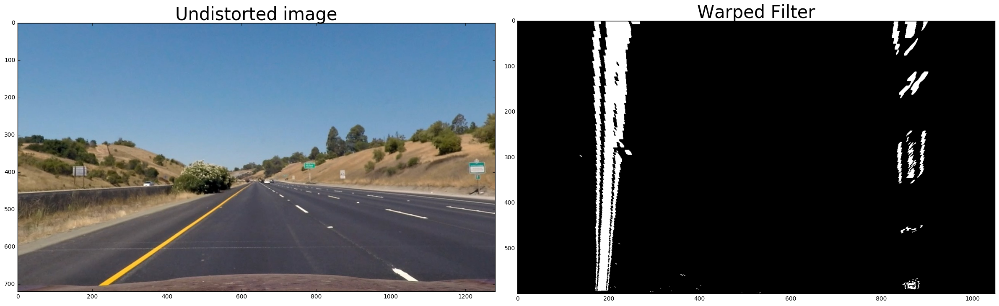

In [8]:
warped_binary_image = birds_eye.warp(binary_image)

plot_12({'image': lanes_udst, 'title': 'Undistorted image'},
        {'image': warped_binary_image, 'title': 'Warped Filter', 'cmap': 'gray'})

## Detect lane pixels and fit to find the lane boundary

For lane detections there's two techniques used:

* Sliding window (blind search)
* Search in the previous fit

Sliding windows is achieved by the class _LaneDetectionSW_ and the previous fit search is achieved by the class _LaneDetectionLF_, both defined in *p4lib/lane_detection.py*

Both classes provides a consistent API to process images, and given that the code is quiet extense to be put in this description, we'll see hoy both classes works in a visual way:

* Sliding windows starts to locate the base of the lines looking at the peaks of the bottom half of a histogram generated summing all y values.
* After having located the base of both lanes, starts to go upwards in little windows locating the points inside it.
* If the count of points is above a certain quantity, the windows center is moved to the center of those points to follow the curve
* Then, when all points of the lane were detected, a second grade polynomial is fitted to and drawn over the image to see if it matches

For this case, 10 windows were used, with a margin of 100px and 50 as a min count

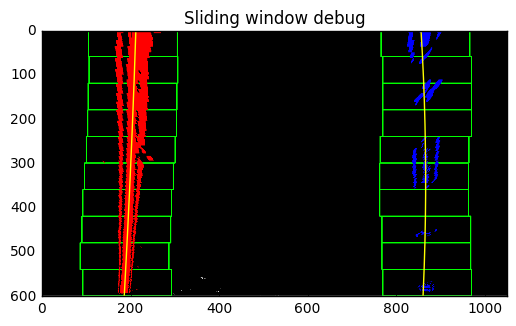

In [9]:
from p4lib.lane_detection import LaneDetectionSW

sw = LaneDetectionSW(debug_img=True)
sw.process(warped_binary_image)
sw_debug = sw.get_debug_img()
fit_leftx, fit_rightx, fity = sw.get_lanes()

# Plot the result
plt.title('Sliding window debug')
plt.imshow(sw_debug)
plt.plot(fit_leftx, fity, color='yellow')
plt.plot(fit_rightx, fity, color='yellow')
plt.xlim(0, birds_eye.warped_image_size[0])
plt.ylim(birds_eye.warped_image_size[1], 0)
plt.show()

In the case that the lanes were previously detected, we can use that information to search in the regions where were in the past.

For this we need the previous feet for both lanes, and a margin to create a region in the interval [fit-margin, fit+margin]: all the points found in that region are assigned to the corresponding lane.

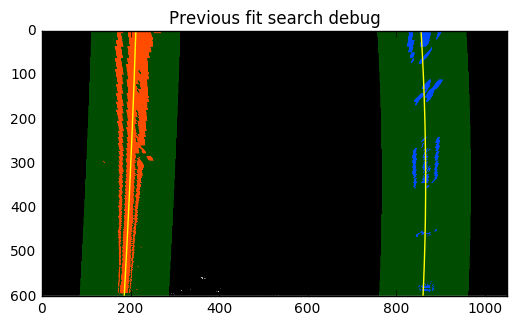

In [10]:
from p4lib.lane_detection import LaneDetectionLF

# Get the previous fit from the sliding windows
left_fit, right_fit = sw.get_fit()

lf = LaneDetectionLF(debug_img=True)
lf.process(warped_binary_image, left_fit, right_fit)
lf_debug = lf.get_debug_img()
fit_leftx, fit_rightx, fity = lf.get_lanes()

# Plot the result
plt.title('Previous fit search debug')
plt.imshow(lf_debug)
plt.plot(fit_leftx, fity, color='yellow')
plt.plot(fit_rightx, fity, color='yellow')
plt.xlim(0, birds_eye.warped_image_size[0])
plt.ylim(birds_eye.warped_image_size[1], 0)
plt.show()

## Determine the curvature of the lane and vehicle position with respect to center

Curvature of a curved line is determined by the following formula:

$$Rcurve = {(1+(2Ay+B)^2)^{3/2}}\over{|2A|}$$

which translate to code into:

```python
((1 + (2*left_fit[0] * self.__pix2meters(self.image_height, 'y') + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
```

Our lane detection classes do the math for us:

In [11]:
left_curvature, right_curvature = sw.get_curvature()
print('Sliding window - Left curvature: {:.2f}m, Right curvature: {:.2f}m'.format(left_curvature, right_curvature))

left_curvature, right_curvature = lf.get_curvature()
print('Previous fit - Left curvature: {:.2f}m, Right curvature: {:.2f}m'.format(left_curvature, right_curvature))

Sliding window - Left curvature: 8554.68m, Right curvature: 1842.82m
Previous fit - Left curvature: 8554.68m, Right curvature: 1842.82m


Also the offset with respect to the center of the lane is calculated:

In [12]:
print('Sliding window - Offset: {}cm'.format(sw.get_offset() * 100))
print('Previour fit - Offset: {}cm'.format(lf.get_offset() * 100))

Sliding window - Offset: 0.9766200952822277cm
Previour fit - Offset: 0.976620095280545cm


## Warp the detected lane boundaries back onto the original image

After the lanes were correctly detected in the warped image, a color mask is created, a polygon is drawn using the lanes as delimiters and then it unwarped to be blended with the original image. The helper funcion is defined in the *p4lib/utils.py* file and its called draw_lanes. This way we'll have the lanes correctly marked on the road: 

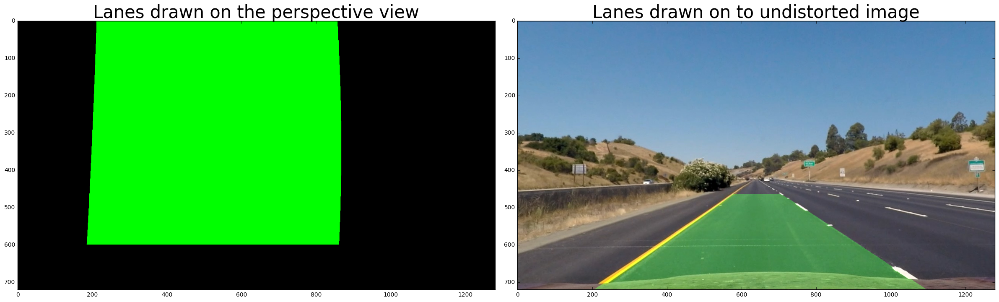

In [13]:
from p4lib import utils

fit_leftx, fit_rightx, fity = lf.get_lanes()
# 9) Draw the lanes over the frame
lanes_drawn_unwarped, lanes_drawn = utils.draw_lanes(lanes_udst, binary_image, {'left': [fit_leftx, fity], 'right': [fit_rightx, fity]}, birds_eye)

plot_12({'image': lanes_drawn_unwarped, 'title': 'Lanes drawn on the perspective view'},
        {'image': lanes_drawn, 'title': 'Lanes drawn on to undistorted image'})

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position

This is the full video annotated:

[![Advanced Lane Lines Detection](http://img.youtube.com/vi/mPnMpomTmNg/0.jpg)](http://www.youtube.com/watch?v=mPnMpomTmNg "Advanced Lane Lines Detection")

## Discussion

This was a very enjoyable project but also very time consuming. I started to build the pieces one by one, and when everything was working good I started to modularize by using an OOP approach. I think that if I would have started with the OOP from the very beginnig I could have saved a lot of time.

Lots of things were left out:

* The switch between sliding window and previous fit search is not robust, it switchs after the first frame and if no lanes are detected on that frame anything could happen. A LaneManager class could be developed to track the lanes detected to
    * give consistent results, averaging the last N detections
    * set parameters to discard bad frames and still keep the lanes that were correctly found
* The lane detection is not robust to changes in lightening, in the presence of shadows for example. Harder challenges showed this flaw
* There's no check if the lanes found have consistency with the real world: they should be separated by 3.7m according to regulations. That could avoid false detections (when there's more than two peaks in the histogram for example)
* The lane detections classes could be refactored to present a more consistent API. For example the sliding window receives just the image as parameter, but the previous search receives the image and both fitted lanes.
* A road detection could help in the case that no lanes are present on the road. The algorithm should find the nearest lines (or separation) from the non drivable terrain.